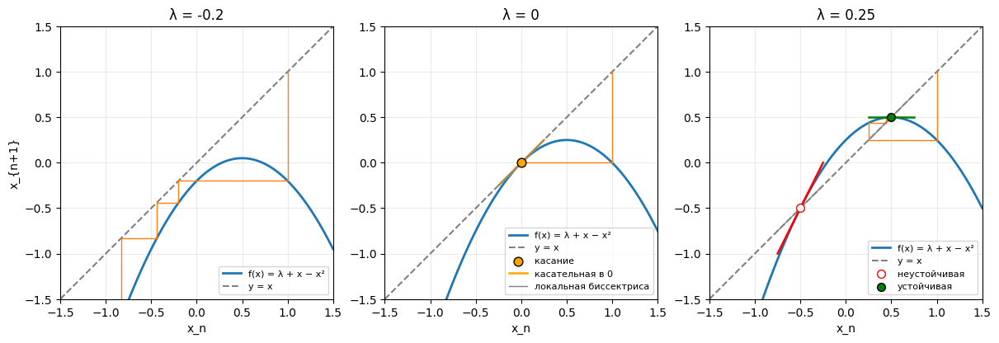

In [2]:
import numpy as np
import matplotlib.pyplot as plt

def f(x, lam):
    x_arr = np.asarray(x, dtype=np.float64)
    return lam + x_arr - x_arr * x_arr

def fp(x):
    x = float(x)
    return 1.0 - 2.0 * x

def cobweb(ax, lam, x0=1.0, n_iter=25, xr=(-1.5, 1.5)):
    xs = np.linspace(xr[0], xr[1], 800, dtype=np.float64)

    # f(x) и y=x
    ax.plot(xs, f(xs, lam), color='C0', lw=2, label='f(x) = λ + x − x²')
    ax.plot(xs, xs, color='gray', lw=1.5, ls='--', label='y = x')

    # диаграмма Ламерея
    x = float(x0)
    for _ in range(n_iter):
        y = float(f(x, lam))
        if not np.isfinite(y) or abs(y) > 1e6:
            break
        ax.plot([x, x], [x, y], color='C1', lw=1)   # вертикаль
        ax.plot([x, y], [y, y], color='C1', lw=1)   # горизонталь
        x = y

    # Неподвижные точки и локальные касательные/биссектрисы
    delta = 0.25
    if abs(lam) < 1e-12:
        x_star = 0.0
        mu = fp(x_star)  # = 1
        ax.scatter([0], [0], s=60, c='orange', edgecolors='k', zorder=5, label='касание')
        xs_seg = np.array([-delta, +delta]) # для построения отрезков касательных
        ax.plot(xs_seg, mu*xs_seg, color='orange', lw=1.8, label="касательная в 0")
        ax.plot(xs_seg, xs_seg, color='gray', lw=1, label="локальная биссектриса")
    elif lam > 0:
        for x_star in (-np.sqrt(lam), np.sqrt(lam)):
            mu = fp(x_star)
            stable = abs(mu) < 1
            if stable:
                ax.scatter([x_star], [x_star], s=50, c='green', edgecolors='k', zorder=5, label='устойчивая' if x_star>0 else None)
            else:
                ax.scatter([x_star], [x_star], s=50, facecolors='white', edgecolors='red', zorder=5, label='неустойчивая' if x_star<0 else None)

            xs_seg = np.array([x_star - delta, x_star + delta])
            ax.plot(xs_seg, x_star + mu*(xs_seg - x_star), color='green' if stable else 'red', lw=1.8)
            ax.plot(xs_seg, x_star + (xs_seg - x_star), color='gray', lw=1)

    ax.set_xlim(*xr); ax.set_ylim(*xr); ax.set_aspect('equal', adjustable='box')
    ax.grid(alpha=0.25)
    ax.set_title(f"λ = {lam:g}")
    ax.legend(loc='lower right', fontsize=8, framealpha=0.8)

fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)
for ax, lam in zip(axes, [-0.2, 0.0, 0.25]):
    cobweb(ax, lam, x0=1.0, n_iter=25, xr=(-1.5, 1.5))
    ax.set_xlabel('x_n')
axes[0].set_ylabel('x_{n+1}')
plt.show()

In [7]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio
pio.templates.default = "plotly_white"

def f(x, lam):
    x_arr = np.asarray(x, dtype=np.float64)
    return lam + x_arr - x_arr * x_arr

def fp(x):
    x = float(x)
    return 1.0 - 2.0 * x

def make_plotly_animation(lam_min=-0.4, lam_max=0.6, steps=150, x_range=(-1.5, 1.5)):
    xs = np.linspace(x_range[0], x_range[1], 900, dtype=np.float64)

    fig = go.Figure(data=[
        go.Scatter(x=xs, y=f(xs, lam_min), mode='lines', name='f(x) = λ + x − x²',
                   line=dict(color='blue', width=3)),
        go.Scatter(x=xs, y=xs, mode='lines', name='y = x',
                   line=dict(color='gray', dash='dash')),
        go.Scatter(x=[], y=[], mode='markers', name='касание',
                   marker=dict(color='orange', size=10, line=dict(color='black', width=1))),
        go.Scatter(x=[], y=[], mode='markers', name='устойчивые x*',
                   marker=dict(color='green', size=9, line=dict(color='black', width=1))),
        go.Scatter(x=[], y=[], mode='markers', name='неустойчивые x*',
                   marker=dict(color='red', size=9, symbol='circle-open', line=dict(width=2))),
        go.Scatter(x=[], y=[], mode='lines', name='касательная в x* (уст)',
                   line=dict(color='green', width=2)),
        go.Scatter(x=[], y=[], mode='lines', name='касательная в x* (неуст)',
                   line=dict(color='red', width=2)),
        #go.Scatter(x=[], y=[], mode='lines', name='локальная биссектриса в x*',
        #           line=dict(color='gray', width=1)),
    ])

    frames = []
    lam_values = np.linspace(lam_min, lam_max, steps, dtype=np.float64)
    delta = 0.30
    eps = 1e-8

    for lam in lam_values:
        y_f = f(xs, lam)

        # Точка касания при λ≈0
        if abs(lam) < eps:
            xt_touch, yt_touch = [0.0], [0.0]
        else:
            xt_touch, yt_touch = [], []

        # неподв точки
        xs_stab, ys_stab = [], []
        xs_unst, ys_unst = [], []
        x_tan_stab, y_tan_stab = [], []
        x_tan_unst, y_tan_unst = [], []
        x_bis, y_bis = [], []

        if lam > 0:
            for x_star in (-np.sqrt(lam), np.sqrt(lam)):
                mu = fp(x_star)
                x_seg = [x_star - delta, x_star + delta, None]
                # локальная биссектриса
                y_seg_bis = [x_star + (x_seg[0]-x_star), x_star + (x_seg[1]-x_star), None]
                x_bis += x_seg; y_bis += y_seg_bis
                # касательная к f в x*
                y_seg_tan = [x_star + mu*(x_seg[0]-x_star), x_star + mu*(x_seg[1]-x_star), None]
                if abs(mu) < 1:  # устойчивая
                    xs_stab.append(x_star); ys_stab.append(x_star)
                    x_tan_stab += x_seg; y_tan_stab += y_seg_tan
                else:            # неустойчивая
                    xs_unst.append(x_star); ys_unst.append(x_star)
                    x_tan_unst += x_seg; y_tan_unst += y_seg_tan

        frames.append(go.Frame(
            name=f"λ={lam:.3f}",
            data=[
                go.Scatter(x=xs, y=y_f),                # f(x)
                go.Scatter(x=xs, y=xs),                 # y=x
                go.Scatter(x=xt_touch, y=yt_touch),     # касание
                go.Scatter(x=xs_stab, y=ys_stab),       # уст.
                go.Scatter(x=xs_unst, y=ys_unst),       # неуст.
                go.Scatter(x=x_tan_stab, y=y_tan_stab), # касательные уст.
                go.Scatter(x=x_tan_unst, y=y_tan_unst), # касательные неуст.
                #go.Scatter(x=x_bis, y=y_bis),           # локальные биссектрисы
            ],
            layout=go.Layout(title_text=f"Седло-узловая бифуркация: λ = {lam:.3f}")
        ))

    fig.frames = frames
    fig.update_layout(
        width=750, height=600,
        xaxis=dict(range=list(x_range), zeroline=False),
        yaxis=dict(range=list(x_range), zeroline=False, scaleanchor='x', scaleratio=1),
        title=f"Седло-узловая бифуркация: λ = {lam_values[0]:.3f}",
        legend=dict(orientation='h', y=-0.18),
        updatemenus=[dict(
            type='buttons', showactive=False, x=0.02, y=1.12,
            buttons=[
                dict(label='Play', method='animate',
                     args=[None, dict(frame=dict(duration=60, redraw=True),
                                      transition=dict(duration=0),
                                      fromcurrent=True, mode='immediate')]),
                dict(label='Pause', method='animate',
                     args=[[None], dict(frame=dict(duration=0, redraw=False),
                                        transition=dict(duration=0),
                                        mode='immediate')]),
            ]
        )],
        sliders=[dict(
            x=0.12, y=1.08, len=0.8,
            steps=[dict(method='animate',
                        args=[[f"λ={lam:.3f}"],
                              dict(mode='immediate',
                                   frame=dict(duration=0, redraw=True),
                                   transition=dict(duration=0))],
                        label=f"{lam:.3f}")
                   for lam in lam_values]
        )]
    )
    fig.show()
    return fig

# запуск
_ = make_plotly_animation(lam_min=-0.4, lam_max=0.6, steps=140, x_range=(-1.5, 1.5))